In [123]:
import os
os.environ['TF_USE_LEGACY_KERAS'] = '1'
import pandas as pd
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text  # pour les transformateurs de texte
from tensorflow.keras import layers
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report,roc_auc_score,confusion_matrix, ConfusionMatrixDisplay
from official.nlp import optimization 
from transformers import RobertaTokenizer, TFRobertaForSequenceClassification
from tensorflow.keras.callbacks import ModelCheckpoint
import transformers
import numpy as np
from functions import *
import seaborn as sns
import matplotlib.pyplot as plt


from transformers import pipeline

### 1-Préparation des données

In [124]:
df = pd.concat([pd.read_csv("source_data/goemotions_1.csv"),pd.read_csv("source_data/goemotions_2.csv"),pd.read_csv("source_data/goemotions_3.csv")],ignore_index=True)
df.describe()

,created_utc,rater_id,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
count,2.112250e+05,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,...,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000
mean,1.547659e+09,37.619742,0.081103,0.043768,0.038272,0.064472,0.083418,0.028401,0.034840,0.045885,...,0.038779,0.008569,0.041259,0.006164,0.041591,0.006102,0.011954,0.031994,0.026105,0.261797
std,7.696842e+05,23.070528,0.272994,0.204580,0.191853,0.245592,0.276514,0.166116,0.183374,0.209236,...,0.193067,0.092172,0.198890,0.078269,0.199653,0.077880,0.108679,0.175985,0.159448,0.439614
min,1.546301e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.546993e+09,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.547664e+09,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.548320e+09,57.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.548979e+09,81.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [125]:
#ajout du second jeu d'emotion en mode onehot
df2=pd.read_csv("source_data/more_emotions.csv",sep=";")
df2.dropna()
dfmore=pd.get_dummies(df2["emotion"], dtype=int)
dfmore['text']=df2['text']

df = pd.concat([df,dfmore])

In [126]:
df.describe()

,created_utc,rater_id,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
count,2.112250e+05,211225.000000,211225.000000,211225.000000,231225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,...,231225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,211225.000000,231225.000000,231225.000000,211225.000000
mean,1.547659e+09,37.619742,0.081103,0.043768,0.046677,0.064472,0.083418,0.028401,0.034840,0.045885,...,0.042521,0.008569,0.041259,0.006164,0.041591,0.006102,0.011954,0.054298,0.026956,0.261797
std,7.696842e+05,23.070528,0.272994,0.204580,0.210948,0.245592,0.276514,0.166116,0.183374,0.209236,...,0.201776,0.092172,0.198890,0.078269,0.199653,0.077880,0.108679,0.226605,0.161956,0.439614
min,1.546301e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.546993e+09,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.547664e+09,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.548320e+09,57.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.548979e+09,81.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [127]:
df.tail()

,text,id,author,subreddit,link_id,parent_id,created_utc,rater_id,example_very_unclear,admiration,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
19995,im having ssa examination tomorrow in the morn...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,1,0,NaN
19996,i constantly worry about their fight against n...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN
19997,i feel its important to share this info for th...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN
19998,i truly feel that if you are passionate enough...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN
19999,i feel like i just wanna buy any cute make up ...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,NaN,NaN,NaN,NaN,NaN,NaN,0,0,NaN


In [128]:
#supprimer les doublons
df.describe()
df= df.drop_duplicates(subset='text', keep='first')
df.describe()

,created_utc,rater_id,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,...,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise,neutral
count,5.773200e+04,57732.000000,57732.000000,57732.000000,77680.000000,57732.000000,57732.000000,57732.000000,57732.000000,57732.000000,...,77680.000000,57732.000000,57732.000000,57732.000000,57732.000000,57732.000000,57732.000000,77680.000000,77680.000000,57732.000000
mean,1.547659e+09,37.718544,0.083766,0.045729,0.063285,0.060123,0.083801,0.027472,0.034539,0.047980,...,0.051197,0.008262,0.042056,0.006062,0.040861,0.006357,0.012281,0.098185,0.028489,0.267962
std,7.696604e+05,23.013402,0.277040,0.208898,0.243477,0.237716,0.277092,0.163455,0.182610,0.213726,...,0.220401,0.090522,0.200720,0.077626,0.197970,0.079477,0.110138,0.297566,0.166365,0.442902
min,1.546301e+09,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.546994e+09,19.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,1.547665e+09,37.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.548321e+09,57.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,1.548979e+09,81.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [129]:

#ne sortir que les 5 emotions + neutral
#anger, fear, joy, sadness, surprise, neutral et remplir les NAN par des 0
valid_fields = ['text','anger', 'fear', 'joy', 'sadness', 'surprise', 'neutral']
df_filtered = df[valid_fields]
df_filtered["neutral"]=df_filtered["neutral"].fillna(0)
df_filtered["neutral"] = df_filtered["neutral"].astype(int)

df_filtered = df_filtered[df_filtered.drop('text', axis=1).sum(axis=1) > 0]
df_filtered.tail()

/tmp/ipykernel_2218/1346029709.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["neutral"]=df_filtered["neutral"].fillna(0)
/tmp/ipykernel_2218/1346029709.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered["neutral"] = df_filtered["neutral"].astype(int)


,text,anger,fear,joy,sadness,surprise,neutral
19995,im having ssa examination tomorrow in the morn...,0,0,0,1,0,0
19996,i constantly worry about their fight against n...,0,0,1,0,0,0
19997,i feel its important to share this info for th...,0,0,1,0,0,0
19998,i truly feel that if you are passionate enough...,0,0,1,0,0,0
19999,i feel like i just wanna buy any cute make up ...,0,0,1,0,0,0


In [130]:
#counts
sums=df_filtered.select_dtypes(include=['number']).sum().apply(int)
sums

anger        4916
fear         3249
joy          8928
sadness      7627
surprise     2213
neutral     15470
dtype: int64

In [131]:
#sortir une colonne emotion pour un reechantillonage efficace

emotion_columns =df_filtered.select_dtypes(include=['int64', 'int32', 'int16', 'int8']).columns

def get_single_emotion(row):
    # On retourne l'émotion où la valeur est 1
    for emotion in emotion_columns:
        if row[emotion] == 1:
            return emotion
    return None  # Au cas où aucune émotion n'est présente (valeur par défaut)

df_filtered['emotion'] = df_filtered.apply(get_single_emotion, axis=1)

df_filtered

,text,anger,fear,joy,sadness,surprise,neutral,emotion
0,That game hurt.,0,0,0,1,0,0,sadness
2,"You do right, if you don't care then fuck 'em!",0,0,0,0,0,1,neutral
4,"[NAME] was nowhere near them, he was by the Fa...",0,0,0,0,0,1,neutral
10,"I have, and now that you mention it, I think t...",0,0,0,0,0,1,neutral
12,BUT IT'S HER TURN! /s,0,0,0,0,0,1,neutral
...,...,...,...,...,...,...,...,...
19995,im having ssa examination tomorrow in the morn...,0,0,0,1,0,0,sadness
19996,i constantly worry about their fight against n...,0,0,1,0,0,0,joy
19997,i feel its important to share this info for th...,0,0,1,0,0,0,joy
19998,i truly feel that if you are passionate enough...,0,0,1,0,0,0,joy


In [132]:
# Définir la taille cible pour chaque classe
target_size = 6000

# Rééchantillonner chaque classe sans ajouter de nouvelles entrées
balanced_df = df_filtered.groupby('emotion').apply(
    lambda x: x.sample(n=target_size, random_state=42) if len(x) > target_size else x
).reset_index(drop=True)

# Vérifier la distribution des classes après rééquilibrage
print(balanced_df['emotion'].value_counts())

emotion
joy         6000
neutral     6000
sadness     6000
anger       4916
fear        3231
surprise    2126
Name: count, dtype: int64


In [133]:
balanced_df.head()

,text,anger,fear,joy,sadness,surprise,neutral,emotion
0,"""Oh, how DARE you discuss the disgustingly unh...",1,0,0,0,0,0,anger
1,Press fucken charges the moment they use your ...,1,0,0,0,0,0,anger
2,Shut up 15 year-old,1,0,0,0,0,0,anger
3,I thought it was very good. The guy was one si...,1,0,0,0,0,0,anger
4,Lol. Build your own or make some tweaks to the...,1,0,0,0,0,0,anger


In [134]:
#on retire ce dont on a plus besoin
df_filtered=df_filtered.drop(columns=['emotion'])
#on melange un bon coup
df_filtered = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)


In [135]:
df = df_filtered[['emotion', 'text']]

df['bert']=df['text'].apply(nettoyer_avant_bert)
df=df.drop(columns=['text'])
df = df.dropna(subset=['bert'])

df

/teamspace/studios/this_studio/export/functions.py:14: MarkupResemblesLocatorWarning: The input looks more like a filename than markup. You may want to open this file and pass the filehandle into Beautiful Soup.
  text = BeautifulSoup(text, "html.parser").get_text()
/tmp/ipykernel_2218/2230630321.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['bert']=df['text'].apply(nettoyer_avant_bert)


,emotion,bert
0,surprise,i feel like i have weird sugar issues that my ...
1,sadness,i can feel it physically sort of aching and no...
2,anger,> pushed all of them Hey dumbass you pushed th...
3,sadness,im tired of feeling so lethargic
4,anger,i feel suck mad and sad
...,...,...
28268,sadness,ive come to a point where i do not feel my sub...
28269,fear,Coming from [NAME] even though it’s a hypothet...
28270,anger,She isn't disrespectful like [NAME] but she's ...
28271,neutral,"All the smut at Target makes me cringe. That, ..."


### 2-Création du modèle et entrainement

#### &nbsp;&nbsp;a)Séparation des different jeux de test, validation, entrainement

In [136]:
# Initialiser le LabelEncoder
label_encoder = LabelEncoder()

# Convertir les étiquettes en entiers
y_encoded = label_encoder.fit_transform(df['emotion'])


# Diviser les données en train et validation (80% train, 10% test,10% validation)
X_train, X_test, y_train, y_test = train_test_split(
    df['bert'],  # Texte (colonne avec le texte nettoyé pour BERT)
    y_encoded,  # Étiquettes d'émotion
    test_size=0.1, 
    random_state=42,stratify=y_encoded
)


X_train, X_val, y_train, y_val = train_test_split(
    X_train, y_train, test_size=0.1, random_state=42,stratify=y_train
)

#### &nbsp;&nbsp;b)Chargement du tokenizer roberta et tokenization

In [137]:
# Charger le tokenizer RoBERTa
tokenizer = RobertaTokenizer.from_pretrained('roberta-base')

# Tokeniser les données
def tokenize_function(texts):
    return tokenizer(texts.tolist(), padding=True, truncation=True, max_length=512)

train_encodings = tokenize_function(X_train)
val_encodings = tokenize_function(X_val)
test_encodings = tokenize_function(X_test)

# Convertir en TensorFlow Dataset
train_dataset = tf.data.Dataset.from_tensor_slices((
    dict(train_encodings), y_train
)).batch(32)

val_dataset = tf.data.Dataset.from_tensor_slices((
    dict(val_encodings), y_val
)).batch(32)

test_dataset = tf.data.Dataset.from_tensor_slices((
    dict(test_encodings), y_test
)).batch(32)

#### &nbsp;&nbsp;c)Chargement du modèle roberta et compilation

In [138]:
# Charger le modèle RoBERTa pour la classification
model = TFRobertaForSequenceClassification.from_pretrained('roberta-base', num_labels=6,hidden_dropout_prob=0.3)


Some weights of the PyTorch model were not used when initializing the TF 2.0 model TFRobertaForSequenceClassification: ['roberta.embeddings.position_ids']
- This IS expected if you are initializing TFRobertaForSequenceClassification from a PyTorch model trained on another task or with another architecture (e.g. initializing a TFBertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaForSequenceClassification from a PyTorch model that you expect to be exactly identical (e.g. initializing a TFBertForSequenceClassification model from a BertForSequenceClassification model).
Some weights or buffers of the TF 2.0 model TFRobertaForSequenceClassification were not initialized from the PyTorch model and are newly initialized: ['classifier.dense.weight', 'classifier.dense.bias', 'classifier.out_proj.weight', 'classifier.out_proj.bias']
You should probably TRAIN this model on a down-stream task to be able to use it for predicti

In [139]:
# Optimiseur AdamW
from tensorflow.keras.optimizers import AdamW
epochs = 10
steps_per_epoch = len(X_train) // 32
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1 * num_train_steps)


# Créer l'optimiseur Adamw
optimizer = optimization.create_optimizer(
    init_lr=2e-5, 
    num_train_steps=num_train_steps, 
    num_warmup_steps=num_warmup_steps, 
    optimizer_type='adamw'
)
# Compiler le modèle
model.compile(optimizer=optimizer, loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True), metrics=['sparse_categorical_accuracy'])

In [140]:
model.summary()

Model: "tf_roberta_for_sequence_classification_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 roberta (TFRobertaMainLaye  multiple                  124055040 
 r)                                                              
                                                                 
 classifier (TFRobertaClass  multiple                  595206    
 ificationHead)                                                  
                                                                 
Total params: 124650246 (475.50 MB)
Trainable params: 124650246 (475.50 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### &nbsp;&nbsp;d)configuration de l'entrainement et entrainement

In [141]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=2,
    restore_best_weights=True
)
save_best_model=ModelCheckpoint(filepath='emotions', monitor='val_sparse_categorical_accuracy', save_best_only=True,save_format='tf')


In [142]:
# Entraîner le modèle
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=10,
    callbacks=[early_stopping,save_best_model]
)

Epoch 1/10


716/716 [==============================] - ETA: 0s - loss: 1.4379 - sparse_categorical_accuracy: 0.4210INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 550s 729ms/step - loss: 1.4379 - sparse_categorical_accuracy: 0.4210 - val_loss: 0.8220 - val_sparse_categorical_accuracy: 0.7147
Epoch 2/10
716/716 [==============================] - ETA: 0s - loss: 0.7583 - sparse_categorical_accuracy: 0.7435INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 520s 727ms/step - loss: 0.7583 - sparse_categorical_accuracy: 0.7435 - val_loss: 0.6470 - val_sparse_categorical_accuracy: 0.7800
Epoch 3/10
716/716 [==============================] - ETA: 0s - loss: 0.6164 - sparse_categorical_accuracy: 0.7900INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 519s 725ms/step - loss: 0.6164 - sparse_categorical_accuracy: 0.7900 - val_loss: 0.5911 - val_sparse_categorical_accuracy: 0.7945
Epoch 4/10
716/716 [==============================] - ETA: 0s - loss: 0.5460 - sparse_categorical_accuracy: 0.8126INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 520s 726ms/step - loss: 0.5460 - sparse_categorical_accuracy: 0.8126 - val_loss: 0.5807 - val_sparse_categorical_accuracy: 0.7961
Epoch 5/10
716/716 [==============================] - ETA: 0s - loss: 0.5079 - sparse_categorical_accuracy: 0.8253INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 518s 723ms/step - loss: 0.5079 - sparse_categorical_accuracy: 0.8253 - val_loss: 0.5907 - val_sparse_categorical_accuracy: 0.7992
Epoch 6/10
716/716 [==============================] - ETA: 0s - loss: 0.4719 - sparse_categorical_accuracy: 0.8348INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 520s 726ms/step - loss: 0.4719 - sparse_categorical_accuracy: 0.8348 - val_loss: 0.5706 - val_sparse_categorical_accuracy: 0.8075
Epoch 7/10
716/716 [==============================] - ETA: 0s - loss: 0.4435 - sparse_categorical_accuracy: 0.8459INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 520s 727ms/step - loss: 0.4435 - sparse_categorical_accuracy: 0.8459 - val_loss: 0.5831 - val_sparse_categorical_accuracy: 0.8098
Epoch 8/10
716/716 [==============================] - ETA: 0s - loss: 0.4282 - sparse_categorical_accuracy: 0.8478INFO:tensorflow:Assets written to: emotions/assets


INFO:tensorflow:Assets written to: emotions/assets


716/716 [==============================] - 522s 729ms/step - loss: 0.4282 - sparse_categorical_accuracy: 0.8478 - val_loss: 0.5596 - val_sparse_categorical_accuracy: 0.8126
Epoch 9/10
716/716 [==============================] - 484s 676ms/step - loss: 0.4025 - sparse_categorical_accuracy: 0.8569 - val_loss: 0.5727 - val_sparse_categorical_accuracy: 0.8126
Epoch 10/10
716/716 [==============================] - 484s 676ms/step - loss: 0.3940 - sparse_categorical_accuracy: 0.8605 - val_loss: 0.5907 - val_sparse_categorical_accuracy: 0.8043


#### &nbsp;&nbsp;f)prédictions et résultats

In [143]:
y_pred = model.predict(test_dataset)

89/89 [==============================] - 11s 64ms/step


In [144]:
y_pred_classes = np.argmax(y_pred.logits, axis=1)

# Rapport de classification
y_pred_labels = label_encoder.inverse_transform(y_pred_classes)
y_test_labels = label_encoder.inverse_transform(y_test)
print("classification report :\n")
print(classification_report(y_test_labels, y_pred_labels, target_names=label_encoder.classes_))

# Convertir les logits en probabilités
probabilities = tf.nn.softmax(y_pred.logits, axis=-1).numpy()

#rapport auc
auc_scores = {}
# Vérifiez la forme de y_test
if len(y_test.shape) == 1:  # Si y_test est un tableau d'indices de classes
    for i, label in enumerate(["anger", "fear", "joy", "sadness", "surprise", "neutral"]):
        auc_scores[label] = roc_auc_score(y_test == i, probabilities[:, i])  # Comparer y_test à l'index de la classe
else:  # Si y_test est dans un format one-hot
    for i, label in enumerate(["anger", "fear", "joy", "sadness", "surprise", "neutral"]):
        auc_scores[label] = roc_auc_score(y_test[:, i], probabilities[:, i])  # Utilisation du format one-hot

# 5. Afficher les scores AUC
print("AUC Scores:")
for label, auc_score in auc_scores.items():
    print(f"{label}: {auc_score:.4f}")

classification report :

              precision    recall  f1-score   support

       anger       0.72      0.80      0.76       492
        fear       0.78      0.85      0.81       323
         joy       0.90      0.91      0.91       600
     neutral       0.81      0.63      0.71       600
     sadness       0.85      0.88      0.87       600
    surprise       0.67      0.73      0.70       213

    accuracy                           0.81      2828
   macro avg       0.79      0.80      0.79      2828
weighted avg       0.81      0.81      0.80      2828

AUC Scores:
anger: 0.9642
fear: 0.9803
joy: 0.9884
sadness: 0.9518
surprise: 0.9800
neutral: 0.9625


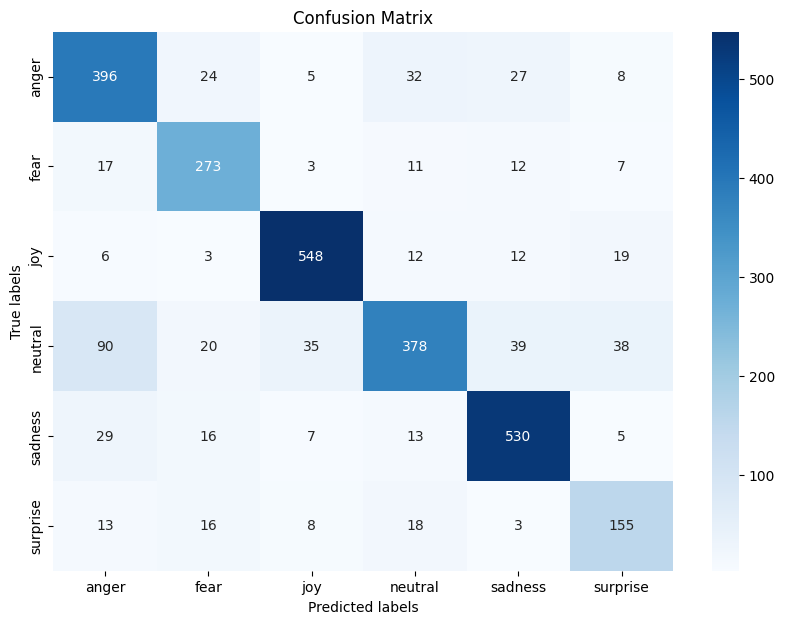

In [145]:

# Calculer et afficher la matrice de confusion
conf_matrix = confusion_matrix(y_test_labels, y_pred_labels, labels=label_encoder.classes_)

plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix')
plt.show()

#### &nbsp;&nbsp;g)Analyse de l'entrainement

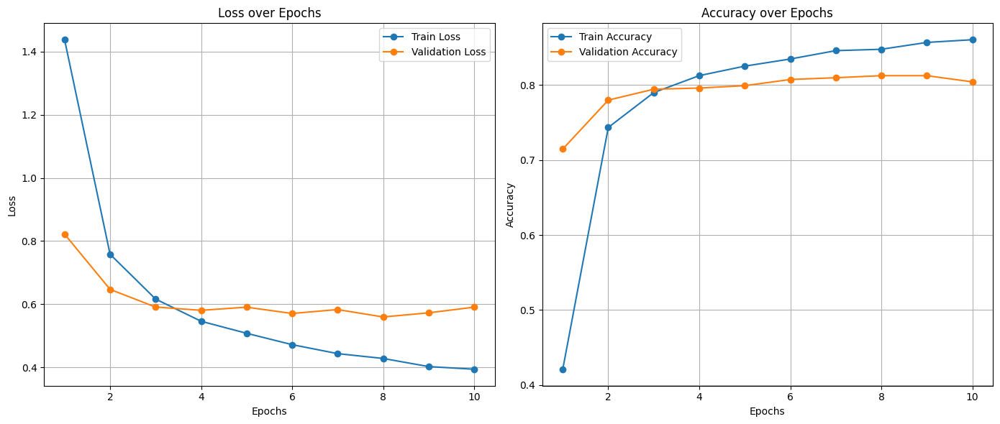

In [146]:
if history.history:
    # Extraction des métriques
    train_loss = history.history['loss']
    val_loss = history.history['val_loss']
    train_accuracy = history.history['sparse_categorical_accuracy']
    val_accuracy = history.history['val_sparse_categorical_accuracy']
    
    epochs_range = range(1, len(train_loss) + 1)

    # Création des graphiques
    plt.figure(figsize=(14, 6))

    # Graphique pour la perte
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, train_loss, label='Train Loss', marker='o')
    plt.plot(epochs_range, val_loss, label='Validation Loss', marker='o')
    plt.title('Loss over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    # Graphique pour la précision
    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, train_accuracy, label='Train Accuracy', marker='o')
    plt.plot(epochs_range, val_accuracy, label='Validation Accuracy', marker='o')
    plt.title('Accuracy over Epochs')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    # Afficher les graphiques
    plt.tight_layout()
    plt.show()

#voir le surraprentissage (ecart entre train et loss)

#### &nbsp;&nbsp;h)Phrases de test

In [147]:
custom_sentences = [
    "I'm absolutely thrilled with this amazing news!",
    "Everything seems hopeless right now.",
    "I can't stop feeling angry about what happened.",
    "I'm terrified of what might happen next.",
    "This is the most boring day ever.",
    "My heart is breaking into pieces.",
    "I'm so frustrated with this situation.",
    "I'm deeply worried about the future.",
    "Life is beautiful and full of joy today!",
    "Rage is consuming me entirely.",
    "This is the most exciting moment of my life!",
    "I feel empty and disconnected.",
    "Nothing could make me happier right now.",
    "What a peaceful and calming experience.",
    "Pure excitement is running through my veins!",
    "I'm overwhelmed with sadness and grief.",
    "Unexpectedly, I'm feeling quite content.",
    "This fear is paralyzing me.",
    "Feeling completely neutral about everything.",
    "I'm feeling completely indifferent."
]

# Tokenize the custom sentences
custom_encodings = tokenizer(custom_sentences, padding=True, truncation=True, max_length=512, return_tensors='tf')

# Predict emotions
predictions = model.predict(dict(custom_encodings))
pred_classes = np.argmax(predictions.logits, axis=1)
pred_labels = label_encoder.inverse_transform(pred_classes)

# Print results
print("Custom Sentence Emotion Predictions:")
for sentence, pred_label in zip(custom_sentences, pred_labels):
    print(f"Sentence: '{sentence}'\nPredicted Emotion: {pred_label}\n")

1/1 [==============================] - 5s 5s/step
Custom Sentence Emotion Predictions:
Sentence: 'I'm absolutely thrilled with this amazing news!'
Predicted Emotion: joy

Sentence: 'Everything seems hopeless right now.'
Predicted Emotion: sadness

Sentence: 'I can't stop feeling angry about what happened.'
Predicted Emotion: anger

Sentence: 'I'm terrified of what might happen next.'
Predicted Emotion: fear

Sentence: 'This is the most boring day ever.'
Predicted Emotion: sadness

Sentence: 'My heart is breaking into pieces.'
Predicted Emotion: sadness

Sentence: 'I'm so frustrated with this situation.'
Predicted Emotion: anger

Sentence: 'I'm deeply worried about the future.'
Predicted Emotion: fear

Sentence: 'Life is beautiful and full of joy today!'
Predicted Emotion: joy

Sentence: 'Rage is consuming me entirely.'
Predicted Emotion: anger

Sentence: 'This is the most exciting moment of my life!'
Predicted Emotion: joy

Sentence: 'I feel empty and disconnected.'
Predicted Emotion: 

#### &nbsp;&nbsp;i)Analyse de l'influence des mots sur le resultat (SHAP : SHapley Additive exPlanations)

In [148]:
import shap
import numpy as np
from transformers import pipeline




# Charger le pipeline pour l'analyseur de texte
text_classifier = pipeline("text-classification", model=model, tokenizer=tokenizer, top_k=None)

def prediction_function(texts):
    if isinstance(texts, str):
        texts = [texts]
    if isinstance(texts, np.ndarray):
        texts = texts.tolist()

    # Préparer les textes sous forme de chaînes
    texts = [str(t) if not isinstance(t, str) else t for t in texts]
    
    # Effectuer la prédiction avec le modèle
    predictions = text_classifier(texts)
    
    # Convertir les prédictions en scores de probabilités
    scores = []
    for pred in predictions:
        # Ici, on ne fait plus de correspondance de labels, on utilise directement l'indice de la classe
        class_probabilities = [item['score'] for item in pred]
        scores.append(class_probabilities)  # Utilisation directe des probabilités
    
    return np.array(scores)

# Créer l'explainer SHAP
explainer = shap.Explainer(prediction_function, tokenizer)

test_text = custom_sentences

# Calculer les valeurs SHAP
shap_values = explainer(test_text)

shap.plots.text(shap_values)

Device set to use 0


  0%|          | 0/110 [00:00<?, ?it/s]

PartitionExplainer explainer:   5%|▌         | 1/20 [00:00<?, ?it/s]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer:  15%|█▌        | 3/20 [00:36<01:16,  4.53s/it]

  0%|          | 0/132 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 4/20 [01:00<03:19, 12.44s/it]

  0%|          | 0/110 [00:00<?, ?it/s]

PartitionExplainer explainer:  25%|██▌       | 5/20 [01:25<04:17, 17.19s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  30%|███       | 6/20 [01:42<03:59, 17.14s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer:  35%|███▌      | 7/20 [01:55<03:25, 15.81s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  40%|████      | 8/20 [02:12<03:14, 16.20s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  45%|████▌     | 9/20 [02:29<03:01, 16.49s/it]

  0%|          | 0/110 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 10/20 [02:54<03:11, 19.17s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer:  55%|█████▌    | 11/20 [03:07<02:35, 17.32s/it]

  0%|          | 0/132 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 12/20 [03:31<02:33, 19.19s/it]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer:  65%|██████▌   | 13/20 [03:40<01:53, 16.16s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  70%|███████   | 14/20 [03:57<01:39, 16.51s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▌  | 15/20 [04:11<01:17, 15.50s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 16/20 [04:28<01:04, 16.03s/it]

  0%|          | 0/90 [00:00<?, ?it/s]

PartitionExplainer explainer:  85%|████████▌ | 17/20 [04:45<00:49, 16.46s/it]

  0%|          | 0/132 [00:00<?, ?it/s]

PartitionExplainer explainer:  90%|█████████ | 18/20 [05:17<00:41, 20.90s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer:  95%|█████████▌| 19/20 [05:30<00:18, 18.59s/it]

  0%|          | 0/72 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 20/20 [05:43<00:00, 16.96s/it]

  0%|          | 0/56 [00:00<?, ?it/s]

PartitionExplainer explainer: 21it [05:52, 17.63s/it]                        
